In [87]:
import numpy as np
import tweepy as tw
import time
import gspread
from oauth2client.service_account import ServiceAccountCredentials
from itertools import islice 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from pandas.plotting import table
import six
import plotly.figure_factory as ff
import psutil

In [88]:
#ENTRAR NO GOOGLE SHEETS E BAIXAR OS DADOS

scope = ['https://www.googleapis.com/auth/spreadsheets', 'https://www.googleapis.com/auth/drive.file',
             "https://www.googleapis.com/auth/drive"]
creds = ServiceAccountCredentials.from_json_keyfile_name('client_secret.json', scope)
client = gspread.authorize(creds)
sheet1 = client.open('TT_dep_federais_DB').worksheet("DB")
sheet2 = client.open('TT_dep_federais_Dim').worksheet("Deputados_Federais")

# PEGANDO DADOS QUE ACABEI DE ADD
sheetopen = client.open("TT_dep_federais_DB").sheet1
list_of_hashes = sheetopen.get_all_records()

sheetopen2 = client.open("TT_dep_federais_Dim").sheet1
list_of_dep = sheetopen2.get_all_records()

df1 = pd.DataFrame(list_of_hashes)
df2 = pd.DataFrame(list_of_dep)

In [89]:
tabela = []

for x in range(1,49):
    df = pd.read_excel (r'C:\Users\Romulo\Programação\Python\Scripts\Twitter\TT_Deputados\WebScraping\Orçamento-Bases\Orçamento-{}.xlsx'.format(x))
    tabela.append(df)
    
novadf = pd.concat(tabela, axis=0)
novadf.drop(['Unnamed: 0','Nome civil', 'email', 'Telefone', 'Endereço', 'Data de Nascimento', 'Naturalidade'], axis=1,  inplace=True)
novadf

,Nome,Mês,Tipo Despesa,Despesa
0,Abou Anni,Janeiro/2020,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,"2828,14"
1,Abou Anni,Janeiro/2020,TELEFONIA,"593,68"
2,Abou Anni,Janeiro/2020,SERVIÇOS POSTAIS,"88,16"
3,Abou Anni,Janeiro/2020,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO","138,91"
4,Abou Anni,Janeiro/2020,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,"423,93"
...,...,...,...,...
424,Zeca Dirceu,Agosto/2020,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.,"3277,89"
425,Zeca Dirceu,Setembro/2020,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,"1428,78"
426,Zeca Dirceu,Setembro/2020,TELEFONIA,"467,42"
427,Zeca Dirceu,Setembro/2020,COMBUSTÍVEIS E LUBRIFICANTES.,"3420,84"


In [91]:
MergedTable = pd.merge(df2,novadf,how='inner',on='Nome')

MergedTable["Despesa"] = (MergedTable["Despesa"].replace('\.','', regex=True)
                        .replace(',','.', regex=True)
                        .replace('- ','', regex=True)
                        .astype(float))

MergedTable

,Twitter,Nome,Link_Wikipedia (Deputado),Partido,Link_Wikipedia (Partido),Coligação,Votos nominais,Nota,Estado,Sigla Estado,Estado PBI,LinkTransparencia,Código-LinkTransparencia,LinkTransparenciaMês,Código-LinkTransparenciaMês,Comentário-LinkTransparencia,Mês,Tipo Despesa,Despesa
0,@abou_anni,Abou Anni,Abou Anni,PSL,PSL,PSL,69.256,,SÃO PAULO,SP,"SÃO PAULO, BRAZIL",https://www.camara.leg.br/deputados/204521,204521,https://www.camara.leg.br/cota-parlamentar/ind...,3413,,Janeiro/2020,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,2828.14
1,@abou_anni,Abou Anni,Abou Anni,PSL,PSL,PSL,69.256,,SÃO PAULO,SP,"SÃO PAULO, BRAZIL",https://www.camara.leg.br/deputados/204521,204521,https://www.camara.leg.br/cota-parlamentar/ind...,3413,,Janeiro/2020,TELEFONIA,593.68
2,@abou_anni,Abou Anni,Abou Anni,PSL,PSL,PSL,69.256,,SÃO PAULO,SP,"SÃO PAULO, BRAZIL",https://www.camara.leg.br/deputados/204521,204521,https://www.camara.leg.br/cota-parlamentar/ind...,3413,,Janeiro/2020,SERVIÇOS POSTAIS,88.16
3,@abou_anni,Abou Anni,Abou Anni,PSL,PSL,PSL,69.256,,SÃO PAULO,SP,"SÃO PAULO, BRAZIL",https://www.camara.leg.br/deputados/204521,204521,https://www.camara.leg.br/cota-parlamentar/ind...,3413,,Janeiro/2020,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",138.91
4,@abou_anni,Abou Anni,Abou Anni,PSL,PSL,PSL,69.256,,SÃO PAULO,SP,"SÃO PAULO, BRAZIL",https://www.camara.leg.br/deputados/204521,204521,https://www.camara.leg.br/cota-parlamentar/ind...,3413,,Janeiro/2020,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,423.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23225,@zeca_dirceu,Zeca Dirceu,Zeca Dirceu,PT,PT,PT,77.306,,PARANÁ,PR,"PARANÁ, BRAZIL",https://www.camara.leg.br/deputados/160592,160592,https://www.camara.leg.br/cota-parlamentar/ind...,2238,,Agosto/2020,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.,3277.89
23226,@zeca_dirceu,Zeca Dirceu,Zeca Dirceu,PT,PT,PT,77.306,,PARANÁ,PR,"PARANÁ, BRAZIL",https://www.camara.leg.br/deputados/160592,160592,https://www.camara.leg.br/cota-parlamentar/ind...,2238,,Setembro/2020,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,1428.78
23227,@zeca_dirceu,Zeca Dirceu,Zeca Dirceu,PT,PT,PT,77.306,,PARANÁ,PR,"PARANÁ, BRAZIL",https://www.camara.leg.br/deputados/160592,160592,https://www.camara.leg.br/cota-parlamentar/ind...,2238,,Setembro/2020,TELEFONIA,467.42
23228,@zeca_dirceu,Zeca Dirceu,Zeca Dirceu,PT,PT,PT,77.306,,PARANÁ,PR,"PARANÁ, BRAZIL",https://www.camara.leg.br/deputados/160592,160592,https://www.camara.leg.br/cota-parlamentar/ind...,2238,,Setembro/2020,COMBUSTÍVEIS E LUBRIFICANTES.,3420.84


In [300]:
byTwitter = MergedTable.loc[(MergedTable['Twitter'] == '@ArthurLira_')].groupby(['Twitter', 'Tipo Despesa'])[["Despesa"]].sum().sort_values('Despesa')

#Total = MergedTable.loc[(MergedTable['Twitter'] == '@AecioNeves')][["Despesa"]].sum()

byTwitter

#Total

Despesa
Twitter      Tipo Despesa                                           
@ArthurLira_ TELEFONIA                                         31.73
             SERVIÇOS POSTAIS                                  73.55
             PASSAGEM AÉREA - RPA                             488.86
             PASSAGEM AÉREA - SIGEPA                         2283.84
             COMBUSTÍVEIS E LUBRIFICANTES.                  12238.64
             DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.           20500.00
             LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES  52200.00

In [299]:

DepList = list(dict.fromkeys(MergedTable["Twitter"].tolist()))
DepList

['@abou_anni',
 '@AcacioFavacho',
 '@AdolfoViana_',
 '@adrianasounovo',
 '@adrianodobaldy',
 '@AecioNeves',
 '@AfonsoFlorence',
 '@DepAfonsoHamm',
 '@afonso_motta',
 '@depaguinaldo11',
 '@FaleiroAirton',
 '–',
 '@Alan_Rick',
 '@Alceu_Moreira',
 '@oficialalesilva',
 '@AlencarBraga13',
 '@alessandromolon',
 '@AlexManentePPS',
 '@depalexsantana',
 '@alefrotabrasil',
 '@lexandreleite',
 '@padilhando',
 '@AleSerfiotis',
 '@AlexisFonteyne',
 '@Alice_Portugal',
 '@alielmachado',
 '@dep_alinegurgel',
 '@AlineSleutjes',
 '@AluisioMendesMA',
 '@amaronetotv',
 '@aferreira2020',
 '@andrepdt12',
 '@DepAndreFufuca',
 '@AndreJanonesAdv',
 '@DeputadaAngela',
 '@AntonioBrito_',
 '@achinaglia',
 '@ArnaldoJardim',
 '@aroldomartins',
 '@ArthurLira_',
 '@DepArthurMaia',
 '@deputadoatila',
 '@dep_acoutinho',
 '@aureacarolinax',
 '@AureoRibeiroRJ',
 '@Baleia_Rossi',
 '@dasilvabenedita',
 '@benesleocadiorn',
 '@BetoFaroPT',
 '@betopereirams',
 '@BetoRosado',
 '@Biakicis',
 '@bibonunes1',
 '@bilac_pinto',
 '@B

In [307]:
Dep = '@marcofeliciano'

validação = MergedTable.loc[(MergedTable['Twitter'] == Dep)]

validação.to_excel("Teste {} .xlsx".format(Dep))

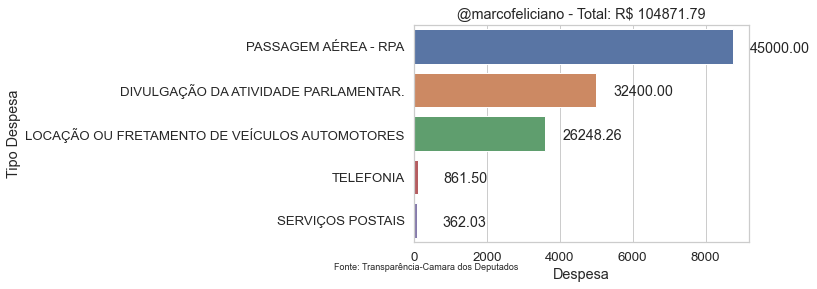

In [304]:




Deputado = '@abou_anni'

sns.set(style="whitegrid", font_scale=1.2)

splot.patches = []
        
Dados = MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])].sort_values('Despesa',ascending=False)
   
splot = sns.barplot(x="Despesa", y="Tipo Despesa", data=MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])].sort_values('Despesa',ascending=False), ci = None)
    
TotalDeputado = list(MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])][["Despesa"]].sum())
 
plt.title("{} - Total: R$ {}".format(DepList[dep], round(TotalDeputado[0],2)))

plt.annotate('Fonte: Transparência-Camara dos Deputados', (0,0), (-80,-20), fontsize=9, 
                     xycoords='axes fraction', textcoords='offset points', va='top')

Legendas = MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])].groupby(['Tipo Despesa'])[["Despesa"]].sum().sort_values('Despesa',ascending=True).values.tolist()

indexlegenda = 0
    
    
    
for bar in reversed(splot.patches):

    width = bar.get_width()
    plt.text(1300+bar.get_width(), bar.get_y()+0.55*bar.get_height(),
                     '{:1.2f}'.format(Legendas[indexlegenda][0]),
                     ha='center', va='center')
    indexlegenda += 1


plt.savefig('{}.png'.format(DepList[dep]), dpi=400, bbox_inches='tight')
    
plt.show()

In [272]:
Legendas

[[64196.34999999999],
 [25480.52],
 [22964.35],
 [11239.369999999999],
 [6233.619999999999],
 [4153.37],
 [3026.72],
 [1610.63]]

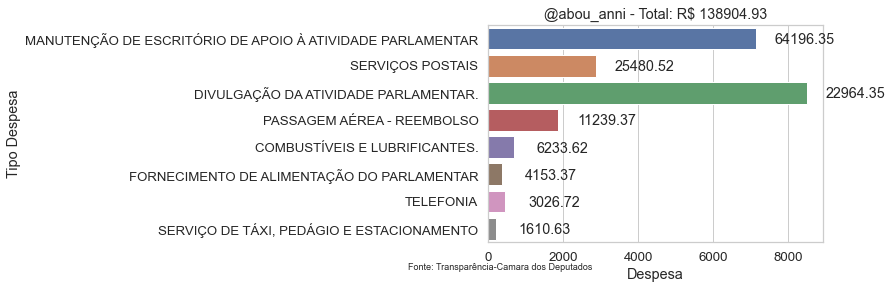

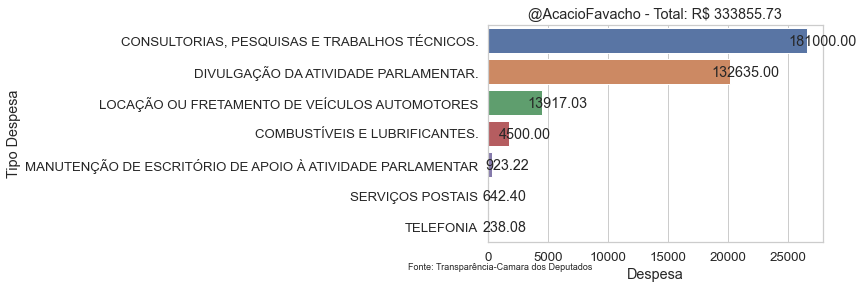

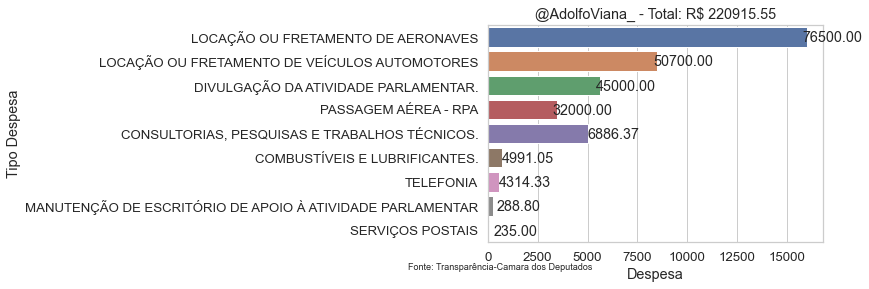

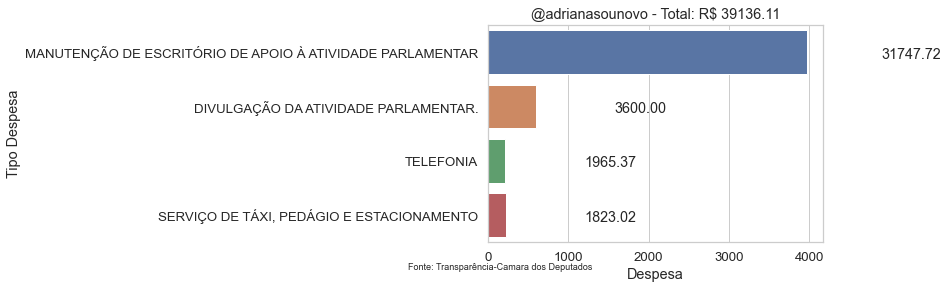

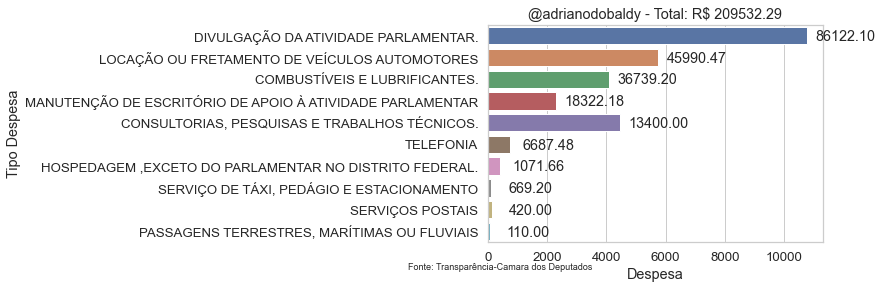

...

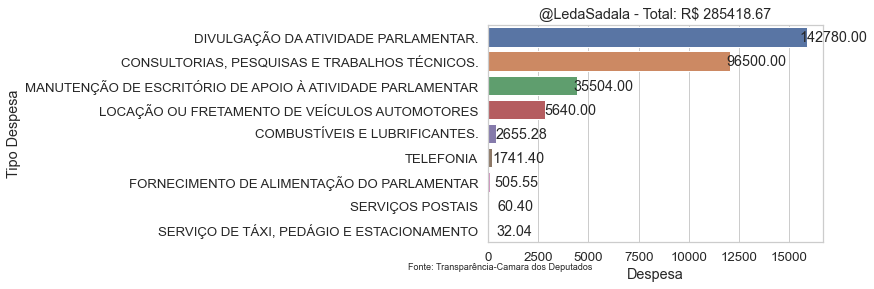

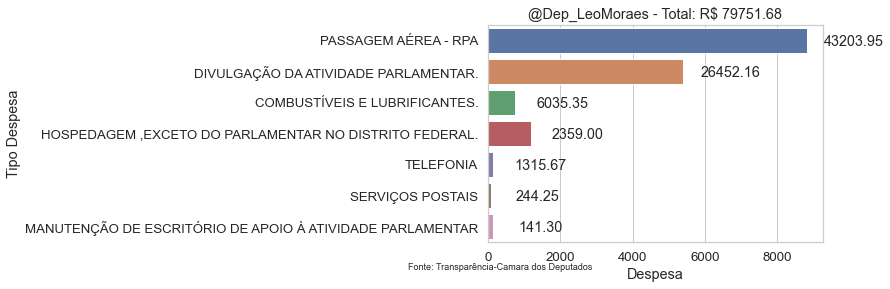

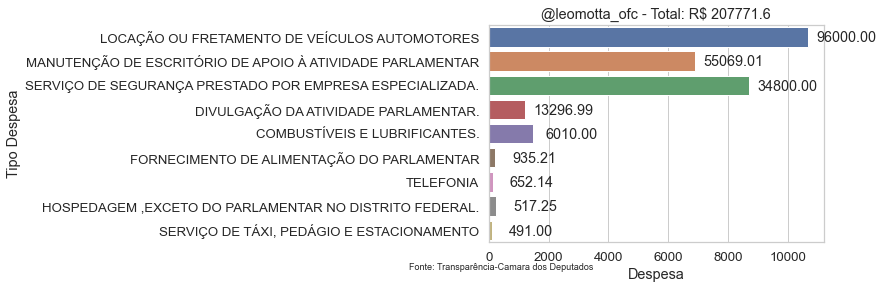

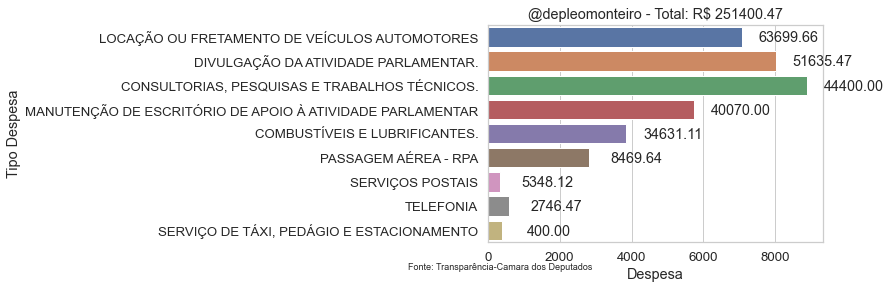

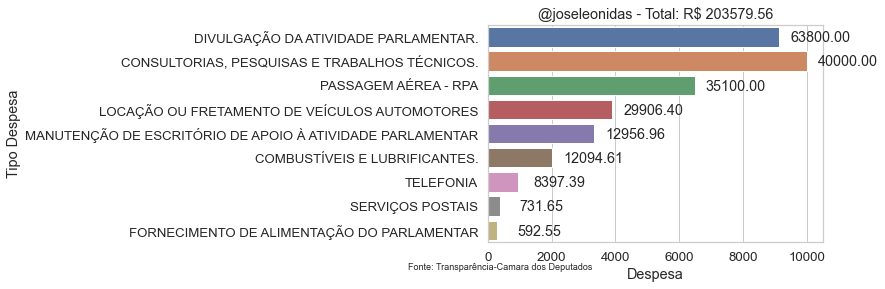

KeyboardInterrupt: 

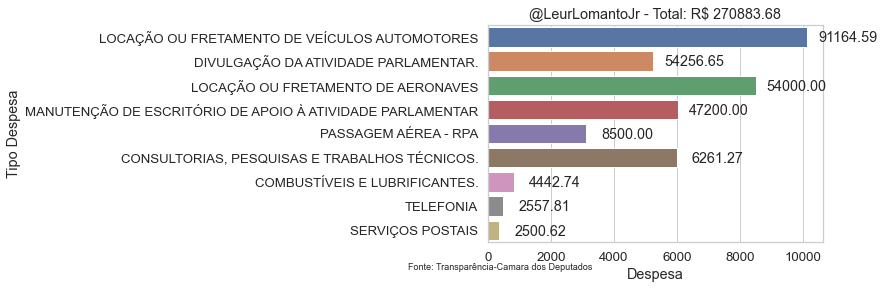

In [308]:
DepList = list(dict.fromkeys(MergedTable["Twitter"].tolist()))

sns.set(style="whitegrid", font_scale=1.2)

for dep in range(len(DepList)):
    
    splot.patches = []
        
    Dados = MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])].sort_values('Despesa',ascending=False)
   
    splot = sns.barplot(x="Despesa", y="Tipo Despesa", data=MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])].sort_values('Despesa',ascending=False), ci = None)
    
    TotalDeputado = list(MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])][["Despesa"]].sum())
 
    plt.title("{} - Total: R$ {}".format(DepList[dep], round(TotalDeputado[0],2)))

    plt.annotate('Fonte: Transparência-Camara dos Deputados', (0,0), (-80,-20), fontsize=9, 
                     xycoords='axes fraction', textcoords='offset points', va='top')

    Legendas = MergedTable.loc[(MergedTable['Twitter'] == DepList[dep])].groupby(['Tipo Despesa'])[["Despesa"]].sum().sort_values('Despesa',ascending=True).values.tolist()

    indexlegenda = 0
    
    
    
    for bar in reversed(splot.patches):

        width = bar.get_width()
        plt.text(1300+bar.get_width(), bar.get_y()+0.55*bar.get_height(),
                     '{:1.2f}'.format(Legendas[indexlegenda][0]),
                     ha='center', va='center')
        indexlegenda += 1


    plt.savefig('{}.png'.format(DepList[dep]), dpi=400, bbox_inches='tight')
    
    plt.show()

In [283]:
splot.patches[-1]